<a href="https://colab.research.google.com/github/shahabafshar/ML-AG-BIO-01/blob/main/HW4/HW_4_PartA_ME_5920_Ag_Bio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Assignment 4
make sure GPU is connected in colab

In [ ]:
# ============================================================
# SECTION 1 — COLAB SETUP AND IMPORTS
# ============================================================
# # This section installs and imports the packages needed for both parts
# of the Ag/Bio assignment.
#
# Task A uses:
#   - AgML to load the Rangeland Weeds Australia dataset
#   - PyTorch / torchvision for ConvNeXt-tiny
#   - scikit-learn for the confusion matrix and classification metrics
#
# Task B uses:
#   - PyTorch for the nanoGPT-style transformer
#   - tiktoken for sub-word tokenization
# ============================================================


# -----------------------------
# 1. Install required packages
# -----------------------------
# If Colab asks to restart the runtime after installation, restart and rerun this cell.

!pip -q install agml tiktoken scikit-learn matplotlib seaborn tqdm

# -----------------------------
# 2. Standard Python imports
# -----------------------------
import os
import random
import math
import time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# 3. PyTorch imports
# -----------------------------
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights

# -----------------------------
# 4. Evaluation imports
# -----------------------------
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report
)

from tqdm.auto import tqdm

# -----------------------------
# 5. AgML and tokenizer imports
# -----------------------------
import agml
import tiktoken


# -----------------------------
# 6. Set random seeds
# -----------------------------

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)


# -----------------------------
# 7. Select device
# -----------------------------
# In Colab:
# Runtime > Change runtime type > Hardware accelerator > GPU

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device being used:", device)

if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0))


# -----------------------------
# 8. Create output folders
# -----------------------------
# These folders will store figures and tables from the assignment.

BASE_DIR = Path("/content/ME5920_AgBio_HW4")
TASK_A_DIR = BASE_DIR / "Task_A_ConvNeXt_Weeds"
TASK_B_DIR = BASE_DIR / "Task_B_nanoGPT"

FIG_DIR = BASE_DIR / "figures"
TABLE_DIR = BASE_DIR / "tables"
MODEL_DIR = BASE_DIR / "models"

for folder in [BASE_DIR, TASK_A_DIR, TASK_B_DIR, FIG_DIR, TABLE_DIR, MODEL_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

print("Base folder:", BASE_DIR)
print("Figure folder:", FIG_DIR)
print("Table folder:", TABLE_DIR)


# -----------------------------
# 9. Helper function for checking tensors
# -----------------------------
# This is just a small utility we can use later to print tensor shapes.

def describe_tensor(x, name="tensor"):
    """
    Print basic information about a PyTorch tensor.
    """
    print(f"{name}:")
    print("  shape:", tuple(x.shape))
    print("  dtype:", x.dtype)
    print("  device:", x.device)


# -----------------------------
# 10. Confirm package versions
# -----------------------------
print("\nPackage versions:")
print("torch:", torch.__version__)
print("torchvision:", __import__("torchvision").__version__)
print("agml:", agml.__version__)
print("tiktoken:", tiktoken.__version__ if hasattr(tiktoken, "__version__") else "installed")

Loading dataset: rangeland_weeds_australia


[AgML Download]: Extracting files for rangeland_weeds_australia... Done!

You have just downloaded rangeland_weeds_australia.

This dataset is licensed under the CC BY-SA 4.0 license.
To learn more, visit: https://creativecommons.org/licenses/by-sa/4.0/

When using this dataset, please cite the following:

@Article{Olsen2019,
  author={Olsen, Alex and Konovalov, Dmitry A. and Philippa, Bronson and Ridd, Peter and Wood, Jake C. and Johns, Jamie and Banks, Wesley and Girgenti, Benjamin and Kenny, Owen and Whinney, James and Calvert, Brendan and Azghadi, Mostafa Rahimi and White, Ronald D.},
  title={DeepWeeds: A Multiclass Weed Species Image Dataset for Deep Learning},
  journal={Scientific Reports},
  year={2019},
  month={Feb},
  day={14},
  volume={9},
  number={1},
  pages={2058},
  abstract={Robotic weed control has seen increased research of late with its potential for boosting productivity in agriculture. Majority of works focus on developing robotics for croplands, ignoring the w

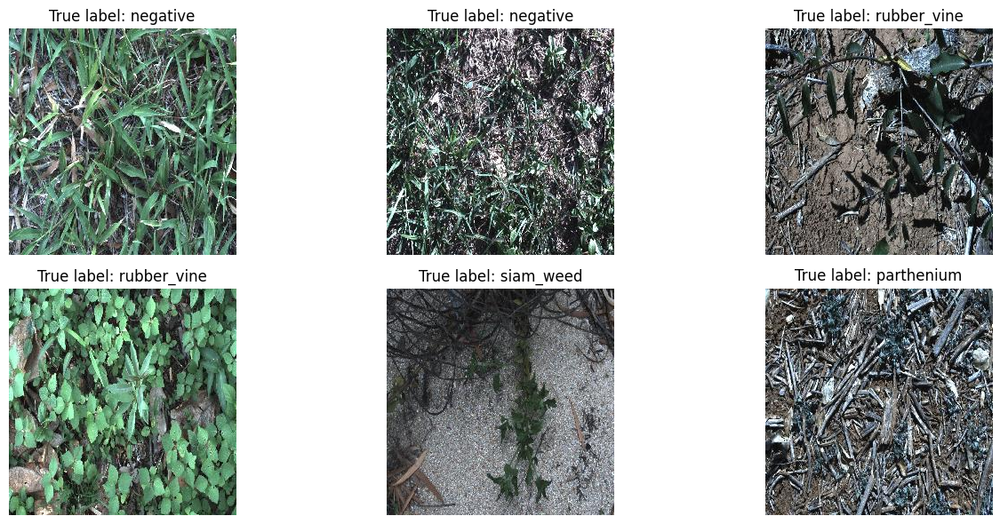


Saved variables for later sections:
CLASS_NAMES: ['chinee_apple', 'lantana', 'negative', 'parkinsonia', 'parthenium', 'prickly_acacia', 'rubber_vine', 'siam_weed', 'snake_weed']
NUM_CLASSES: 9
train_data: 14007
val_data: 1751
test_data: 1751


In [ ]:
# ============================================================
# SECTION 2 — TASK A: LOAD RANGELAND WEEDS AUSTRALIA DATASET
# ============================================================
# This section loads the AgML Rangeland Weeds Australia dataset,
# creates train/validation/test splits, and checks the image classes.
#
# Assignment task:
# Task A asks us to use the Rangeland Weeds Australia dataset and
# evaluate a pretrained ConvNeXt-tiny model on the unseen test set.
# ============================================================


# -----------------------------
# 1. Load the AgML dataset
# -----------------------------

DATASET_NAME = "rangeland_weeds_australia"

print("Loading dataset:", DATASET_NAME)

loader = agml.data.AgMLDataLoader(DATASET_NAME)

print("Dataset loaded successfully.")
print(loader)


# -----------------------------
# 2. Define class names
# -----------------------------
# These are the known classes in the Rangeland Weeds Australia dataset.
# We define them manually so the rest of the notebook is stable even if
# AgML uses a slightly different attribute name for labels.

CLASS_NAMES = [
    "chinee_apple",
    "lantana",
    "negative",
    "parkinsonia",
    "parthenium",
    "prickly_acacia",
    "rubber_vine",
    "siam_weed",
    "snake_weed"
]

NUM_CLASSES = len(CLASS_NAMES)

print("\nNumber of classes:", NUM_CLASSES)
print("Class names:")

for i, name in enumerate(CLASS_NAMES):
    print(f"{i}: {name}")


# -----------------------------
# 3. Split dataset
# -----------------------------
# create train, validation, and test splits.
#
# For Task A, we will only evaluate on test_data.
# We are NOT training ConvNeXt in Task A.

loader.split(train=0.8, val=0.1, test=0.1)

train_data = loader.train_data
val_data   = loader.val_data
test_data  = loader.test_data

print("\nDataset split complete.")
print("Train examples:", len(train_data))
print("Val examples:  ", len(val_data))
print("Test examples: ", len(test_data))


# -----------------------------
# 4. Inspect one example
# -----------------------------

sample_image, sample_label = test_data[0]

print("\nExample from test set:")
print("Image type:", type(sample_image))
print("Label:", sample_label)

if hasattr(sample_image, "shape"):
    print("Image shape:", sample_image.shape)


# -----------------------------
# 5. Plot a few raw test images
# -----------------------------
# This confirms the dataset loaded correctly.
# These are raw images before ConvNeXt preprocessing.

def show_raw_examples(dataset, class_names, n=6):
    """
    Display a few raw images from the dataset.
    """

    plt.figure(figsize=(14, 6))

    for i in range(n):
        image, label = dataset[i]
        label_int = int(label)

        plt.subplot(2, 3, i + 1)
        plt.imshow(image)
        plt.title(f"True label: {class_names[label_int]}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


show_raw_examples(test_data, CLASS_NAMES, n=6)


# -----------------------------
# 6. Confirm saved variables
# -----------------------------

print("\nSaved variables for later sections:")
print("CLASS_NAMES:", CLASS_NAMES)
print("NUM_CLASSES:", NUM_CLASSES)
print("train_data:", len(train_data))
print("val_data:", len(val_data))
print("test_data:", len(test_data))

In [ ]:
# ============================================================
# SECTION 3 — TASK A: BUILD PRETRAINED CONVNEXT-TINY MODEL
# ============================================================
# This section prepares the ImageNet-pretrained ConvNeXt-tiny model
# for the 9-class Rangeland Weeds Australia dataset.
#
# Assignment task:
# To select the pretrained ConvNeXt-tiny model.
# We replace the final classifier layer so the model outputs 9 classes.
#
# We only evaluate it on the unseen test set.
# ============================================================


# -----------------------------
# 1. Define ConvNeXt preprocessing
# -----------------------------
# ConvNeXt-tiny was pretrained on ImageNet.
# Therefore, test images must be resized and normalized the same way
# as the pretrained model expects.

weights = ConvNeXt_Tiny_Weights.DEFAULT
convnext_transform = weights.transforms()

print("Using pretrained weights:")
print(weights)

print("\nConvNeXt preprocessing:")
print(convnext_transform)


# -----------------------------
# 2. Create a custom PyTorch Dataset wrapper
# -----------------------------
# AgML gives images as NumPy arrays.
# PyTorch models expect tensors.
#
# This wrapper:
#   - gets image and label from AgML
#   - converts the image to PIL format if needed
#   - applies ConvNeXt preprocessing
#   - returns image tensor and label tensor

from PIL import Image

class AgMLTorchDataset(torch.utils.data.Dataset):
    """
    Simple wrapper that makes an AgML dataset work with PyTorch DataLoader.
    """

    def __init__(self, agml_dataset, transform=None):
        self.agml_dataset = agml_dataset
        self.transform = transform

    def __len__(self):
        return len(self.agml_dataset)

    def __getitem__(self, idx):
        image, label = self.agml_dataset[idx]

        # Convert NumPy image to PIL image.
        # AgML images are usually RGB NumPy arrays with shape H x W x C.
        if isinstance(image, np.ndarray):
            image = Image.fromarray(image.astype("uint8"))

        # Apply ConvNeXt/ImageNet preprocessing.
        if self.transform is not None:
            image = self.transform(image)

        # Convert label to tensor.
        label = torch.tensor(int(label), dtype=torch.long)

        return image, label


# -----------------------------
# 3. Create test dataset and dataloader
# -----------------------------
# We only need test_loader for Task A evaluation.
# Batch size can be adjusted depending on GPU memory.
# Tesla T4 should handle 32 or 64.

BATCH_SIZE = 32

test_torch_dataset = AgMLTorchDataset(
    agml_dataset=test_data,
    transform=convnext_transform
)

test_loader = DataLoader(
    test_torch_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("\nTest DataLoader created.")
print("Number of test images:", len(test_torch_dataset))
print("Batch size:", BATCH_SIZE)
print("Number of test batches:", len(test_loader))


# -----------------------------
# 4. Load pretrained ConvNeXt-tiny
# -----------------------------
# ConvNeXt-tiny is loaded with ImageNet pretrained weights.

model = convnext_tiny(weights=weights)

print("\nOriginal ConvNeXt classifier:")
print(model.classifier)


# -----------------------------
# 5. Replace final classifier layer
# -----------------------------
# The original model predicts 1000 ImageNet classes.
# Our weed dataset has 9 classes.
#
# ConvNeXt classifier structure usually looks like:
# Sequential(
#   (0): LayerNorm2d(...)
#   (1): Flatten(...)
#   (2): Linear(in_features=768, out_features=1000)
# )
#
# We replace only the last Linear layer.

in_features = model.classifier[2].in_features

model.classifier[2] = nn.Linear(
    in_features=in_features,
    out_features=NUM_CLASSES
)

print("\nModified ConvNeXt classifier:")
print(model.classifier)


# -----------------------------
# 6. Move model to GPU/CPU
# -----------------------------

model = model.to(device)

print("\nModel moved to:", device)


# -----------------------------
# 7. Count model parameters
# -----------------------------
# This is useful to mention in the video/report.

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("\nModel parameter count:")
print(f"Total parameters:     {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")


# -----------------------------
# 8. Test one forward pass
# -----------------------------
# This checks that the dataloader and model work together.

model.eval()

images, labels = next(iter(test_loader))

images = images.to(device)
labels = labels.to(device)

with torch.no_grad():
    outputs = model(images)

print("\nForward pass check:")
describe_tensor(images, "images")
describe_tensor(labels, "labels")
describe_tensor(outputs, "outputs")

print("\nExpected output shape:")
print(f"[batch_size, NUM_CLASSES] = [{images.shape[0]}, {NUM_CLASSES}]")

Using pretrained weights:
ConvNeXt_Tiny_Weights.IMAGENET1K_V1

ConvNeXt preprocessing:
ImageClassification(
    crop_size=[224]
    resize_size=[236]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

Test DataLoader created.
Number of test images: 1751
Batch size: 32
Number of test batches: 55
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 227MB/s] 



Original ConvNeXt classifier:
Sequential(
  (0): LayerNorm2d((768,), eps=1e-06, elementwise_affine=True)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=768, out_features=1000, bias=True)
)

Modified ConvNeXt classifier:
Sequential(
  (0): LayerNorm2d((768,), eps=1e-06, elementwise_affine=True)
  (1): Flatten(start_dim=1, end_dim=-1)
  (2): Linear(in_features=768, out_features=9, bias=True)
)

Model moved to: cuda

Model parameter count:
Total parameters:     27,827,049
Trainable parameters: 27,827,049

Forward pass check:
images:
  shape: (32, 3, 224, 224)
  dtype: torch.float32
  device: cuda:0
labels:
  shape: (32,)
  dtype: torch.int64
  device: cuda:0
outputs:
  shape: (32, 9)
  dtype: torch.float32
  device: cuda:0

Expected output shape:
[batch_size, NUM_CLASSES] = [32, 9]


Evaluating test set:   0%|          | 0/55 [00:00<?, ?it/s]


ConvNeXt-tiny test results:
Test loss:     2.1054
Test accuracy: 0.2153
Test accuracy: 21.53%

Confusion matrix:
[[  4  14  41   0   0   1  48   3   0]
 [  1  35  40   0   0   2  29   0   0]
 [ 51 218 295   8  65 110 108  54   6]
 [  3  12  39   0  27   9   4   3   0]
 [  1  30  49   0   5  10   3   3   1]
 [  2  12  48   1  17  16   0   3   0]
 [ 24  34  28   0   4   5  16   4   0]
 [  5  47  25   0  19   2   5   6   1]
 [  4   9  41   0   1   2  32   6   0]]


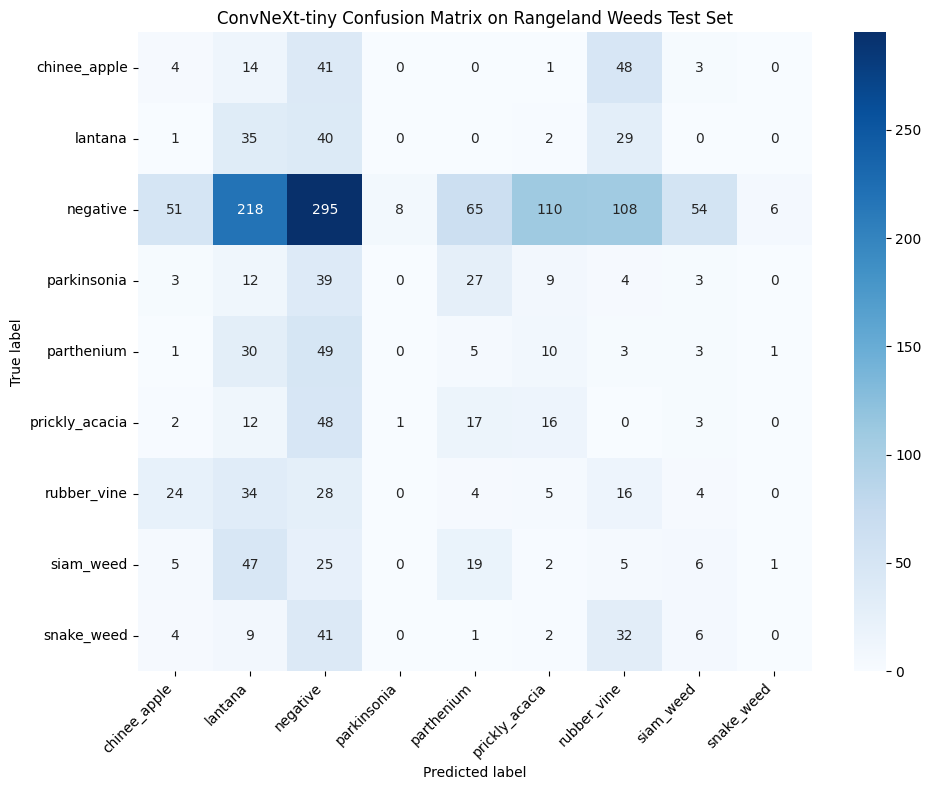

Saved confusion matrix to: /content/ME5920_AgBio_HW4/figures/taskA_convnext_confusion_matrix.png

Classification report:
                precision    recall  f1-score   support

  chinee_apple     0.0421    0.0360    0.0388       111
       lantana     0.0852    0.3271    0.1351       107
      negative     0.4868    0.3224    0.3879       915
   parkinsonia     0.0000    0.0000    0.0000        97
    parthenium     0.0362    0.0490    0.0417       102
prickly_acacia     0.1019    0.1616    0.1250        99
   rubber_vine     0.0653    0.1391    0.0889       115
     siam_weed     0.0732    0.0545    0.0625       110
    snake_weed     0.0000    0.0000    0.0000        95

      accuracy                         0.2153      1751
     macro avg     0.0990    0.1211    0.0978      1751
  weighted avg     0.2790    0.2153    0.2327      1751


Saved CSV outputs:
Confusion matrix: /content/ME5920_AgBio_HW4/tables/taskA_convnext_confusion_matrix.csv
Classification report: /content/ME5920_Ag

,model,pretraining,trained_on_weed_dataset,test_loss,test_accuracy,num_test_images
0,ConvNeXt-tiny,ImageNet,No,2.10538,0.215306,1751


In [ ]:
# ============================================================
# SECTION 4 — TASK A: EVALUATE CONVNEXT-TINY ON TEST SET
# ============================================================
# This section:
#   1. Test loss
#   2. Test accuracy
#   3. Predicted labels
#   4. True labels
#   5. Confusion matrix
#   6. Classification report
#
# Assignment task:
# Compute the loss, classification accuracy,
# and confusion matrix for ConvNeXt on the unseen test set.
# ============================================================


# -----------------------------
# 1. Define loss function
# -----------------------------
# CrossEntropyLoss is standard for multi-class classification.
# It compares the model's class scores against the true class label.

criterion = nn.CrossEntropyLoss()

# -----------------------------
# 2. Evaluation function
# -----------------------------

def evaluate_model(model, dataloader, criterion, device):
    """
    Evaluate a classification model on a dataloader.

    Returns:
        avg_loss: average cross-entropy loss
        accuracy: classification accuracy
        all_true: true labels
        all_pred: predicted labels
        all_probs: class probabilities
    """

    model.eval()

    total_loss = 0.0
    total_correct = 0
    total_samples = 0

    all_true = []
    all_pred = []
    all_probs = []

    with torch.no_grad():
        for images, labels in tqdm(dataloader, desc="Evaluating test set"):
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Loss
            loss = criterion(outputs, labels)

            # Convert logits to probabilities and predicted classes
            probs = torch.softmax(outputs, dim=1)
            preds = torch.argmax(probs, dim=1)

            # Update totals
            batch_size = labels.size(0)
            total_loss += loss.item() * batch_size
            total_correct += (preds == labels).sum().item()
            total_samples += batch_size

            # Save results on CPU
            all_true.extend(labels.cpu().numpy())
            all_pred.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    avg_loss = total_loss / total_samples
    accuracy = total_correct / total_samples

    all_true = np.array(all_true)
    all_pred = np.array(all_pred)
    all_probs = np.array(all_probs)

    return avg_loss, accuracy, all_true, all_pred, all_probs


# -----------------------------
# 3. Run evaluation
# -----------------------------

test_loss, test_accuracy, y_true, y_pred, y_probs = evaluate_model(
    model=model,
    dataloader=test_loader,
    criterion=criterion,
    device=device
)

print("\nConvNeXt-tiny test results:")
print(f"Test loss:     {test_loss:.4f}")
print(f"Test accuracy: {test_accuracy:.4f}")
print(f"Test accuracy: {test_accuracy * 100:.2f}%")

# -----------------------------
# 4. Compute confusion matrix
# -----------------------------

cm = confusion_matrix(y_true, y_pred)

print("\nConfusion matrix:")
print(cm)

# -----------------------------
# 5. Plot confusion matrix
# -----------------------------

plt.figure(figsize=(10, 8))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=CLASS_NAMES,
    yticklabels=CLASS_NAMES
)

plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("ConvNeXt-tiny Confusion Matrix on Rangeland Weeds Test Set")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()

cm_path = FIG_DIR / "taskA_convnext_confusion_matrix.png"
plt.savefig(cm_path, dpi=300, bbox_inches="tight")
plt.show()

print("Saved confusion matrix to:", cm_path)


# -----------------------------
# 6. Classification report
# -----------------------------
# Precision, recall, and F1-score give more detail than accuracy alone.

report = classification_report(
    y_true,
    y_pred,
    target_names=CLASS_NAMES,
    digits=4,
    zero_division=0
)

print("\nClassification report:")
print(report)

# -----------------------------
# 7. Save results to CSV files
# -----------------------------

# Save confusion matrix as CSV
cm_df = pd.DataFrame(
    cm,
    index=[f"true_{name}" for name in CLASS_NAMES],
    columns=[f"pred_{name}" for name in CLASS_NAMES]
)

cm_csv_path = TABLE_DIR / "taskA_convnext_confusion_matrix.csv"
cm_df.to_csv(cm_csv_path)

# Save classification report as CSV
report_dict = classification_report(
    y_true,
    y_pred,
    target_names=CLASS_NAMES,
    digits=4,
    zero_division=0,
    output_dict=True
)

report_df = pd.DataFrame(report_dict).transpose()

report_csv_path = TABLE_DIR / "taskA_convnext_classification_report.csv"
report_df.to_csv(report_csv_path)

# Save summary metrics
summary_df = pd.DataFrame({
    "model": ["ConvNeXt-tiny"],
    "pretraining": ["ImageNet"],
    "trained_on_weed_dataset": ["No"],
    "test_loss": [test_loss],
    "test_accuracy": [test_accuracy],
    "num_test_images": [len(y_true)]
})

summary_csv_path = TABLE_DIR / "taskA_convnext_summary_metrics.csv"
summary_df.to_csv(summary_csv_path, index=False)

print("\nSaved CSV outputs:")
print("Confusion matrix:", cm_csv_path)
print("Classification report:", report_csv_path)
print("Summary metrics:", summary_csv_path)

# -----------------------------
# 8. Preview summary table
# -----------------------------

summary_df

Number of correct predictions: 377
Number of incorrect predictions: 1374
Correct prediction rate: 0.2153055396916048
Incorrect prediction rate: 0.7846944603083952


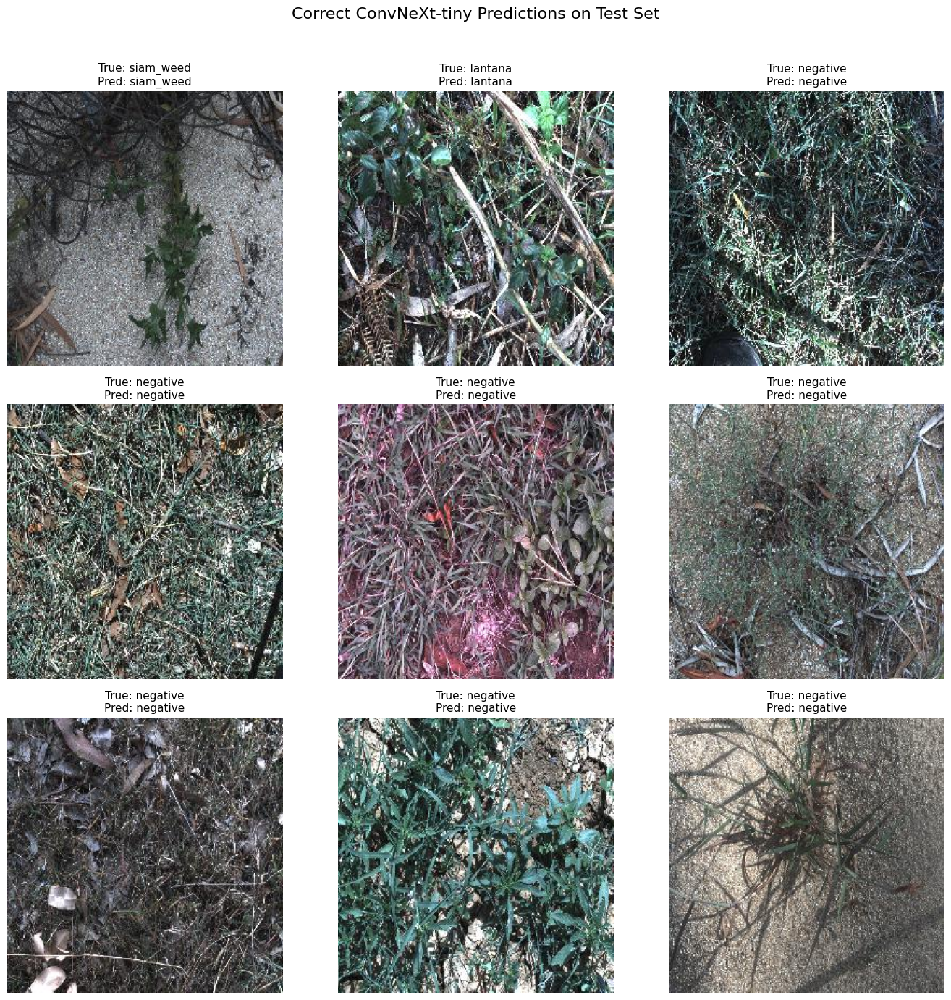

Saved figure to: /content/ME5920_AgBio_HW4/figures/taskA_correct_predictions.png


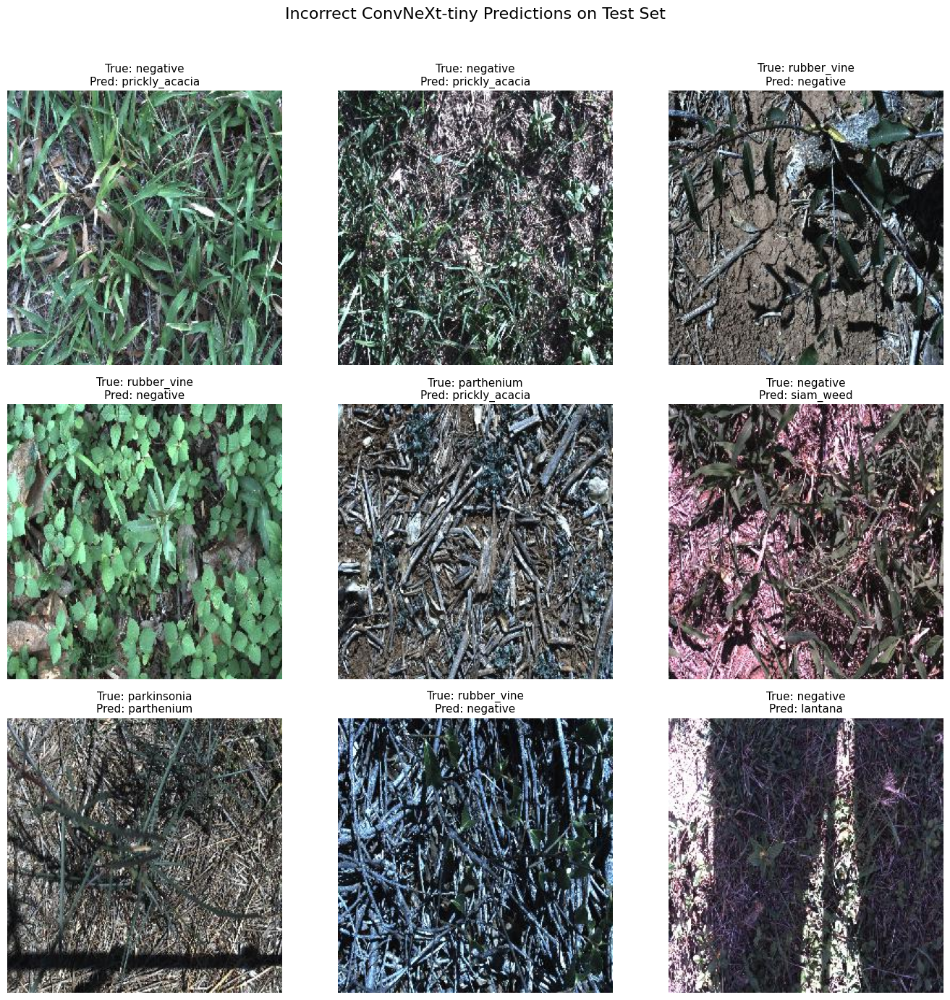

Saved figure to: /content/ME5920_AgBio_HW4/figures/taskA_incorrect_predictions.png


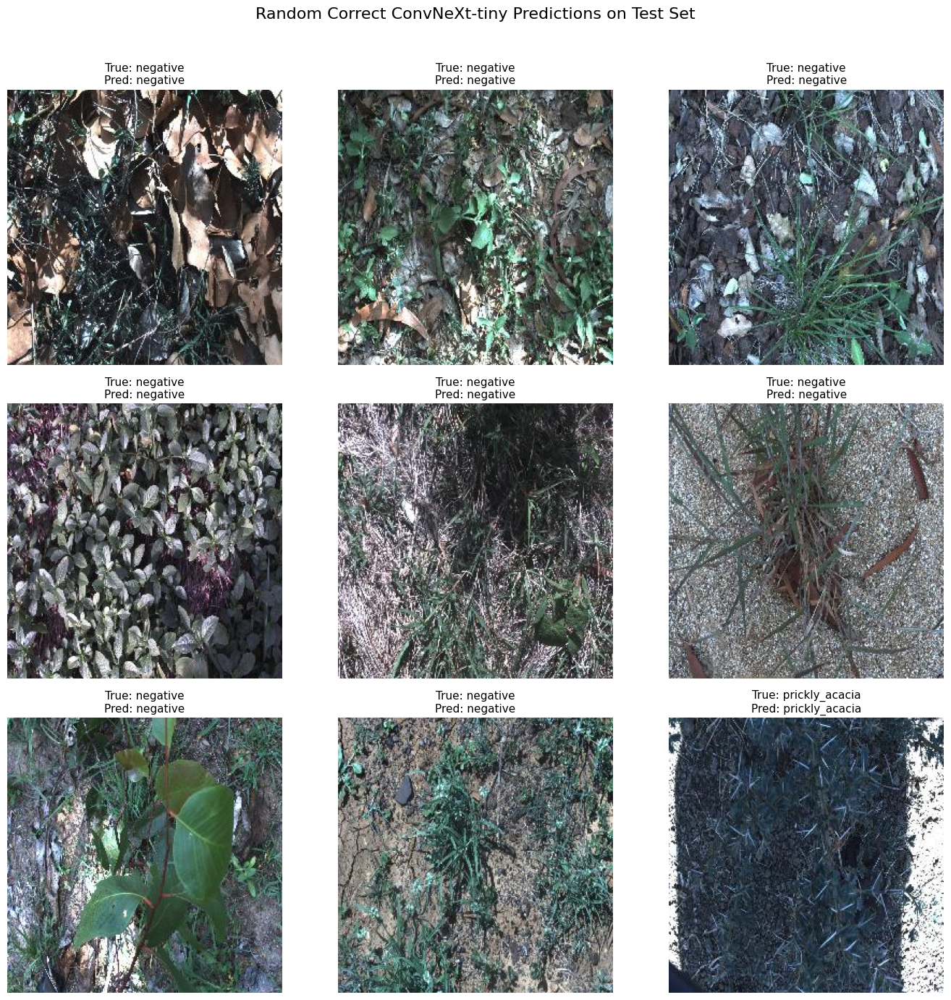

Saved figure to: /content/ME5920_AgBio_HW4/figures/taskA_random_correct_predictions.png


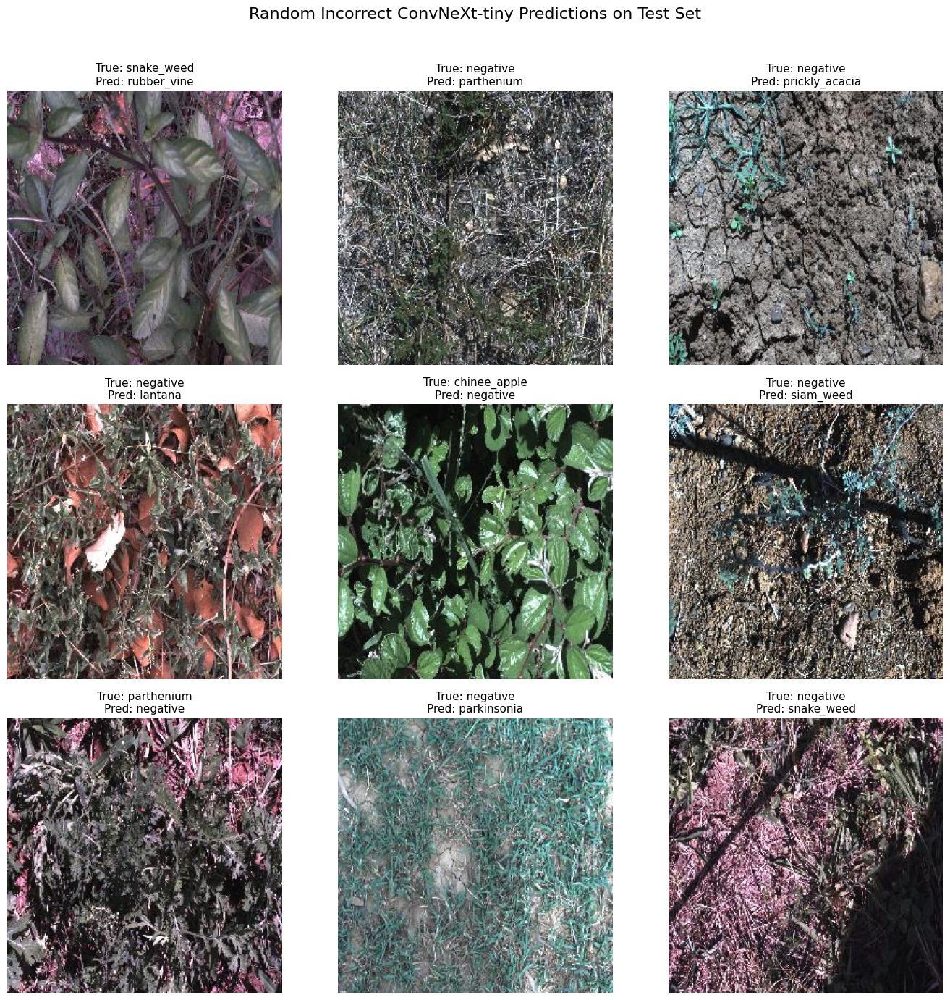

Saved figure to: /content/ME5920_AgBio_HW4/figures/taskA_random_incorrect_predictions.png

Saved prediction table to: /content/ME5920_AgBio_HW4/tables/taskA_convnext_test_predictions.csv


,test_index,true_label_id,pred_label_id,true_class,pred_class,correct,max_prediction_probability
0,0,2,5,negative,prickly_acacia,False,0.143047
1,1,2,5,negative,prickly_acacia,False,0.151175
2,2,6,2,rubber_vine,negative,False,0.191363
3,3,6,2,rubber_vine,negative,False,0.155824
4,4,7,7,siam_weed,siam_weed,True,0.156230
5,5,4,5,parthenium,prickly_acacia,False,0.173978
6,6,1,1,lantana,lantana,True,0.159330
7,7,2,7,negative,siam_weed,False,0.185847
8,8,3,4,parkinsonia,parthenium,False,0.185026
9,9,6,2,rubber_vine,negative,False,0.138947


In [ ]:
# ============================================================
# SECTION 5 — TASK A: SHOW CORRECT AND INCORRECT PREDICTIONS
# ============================================================
# Purpose:
# This section finds examples where ConvNeXt predicted correctly
# and incorrectly, then plots/saves those images.
#
# Assignment connection:
# The assignment asks us to include images of correctly and incorrectly
# classified weeds in the video.
#
# Important:
# These images are from the unseen test set.
# ============================================================


# -----------------------------
# 1. Find correct and incorrect prediction indices
# -----------------------------

correct_indices = np.where(y_true == y_pred)[0]
incorrect_indices = np.where(y_true != y_pred)[0]

print("Number of correct predictions:", len(correct_indices))
print("Number of incorrect predictions:", len(incorrect_indices))

print("Correct prediction rate:", len(correct_indices) / len(y_true))
print("Incorrect prediction rate:", len(incorrect_indices) / len(y_true))


# -----------------------------
# 2. Helper function to get raw image
# -----------------------------
# We use the original AgML test_data so the displayed image is not normalized
# or cropped by ConvNeXt preprocessing.

def get_raw_test_image(index):
    """
    Return the raw image from the AgML test set.
    """
    image, label = test_data[index]
    return image, int(label)


# -----------------------------
# 3. Plot prediction examples
# -----------------------------

def plot_prediction_examples(indices, title, save_path, n=9):
    """
    Plot examples from selected test indices.

    Each subplot shows:
      - true class
      - predicted class
      - whether the prediction was correct or incorrect
    """

    if len(indices) == 0:
        print(f"No examples available for: {title}")
        return

    # Use only the first n examples.
    # You can change this to random selection if you prefer.
    selected_indices = indices[:n]

    n_cols = 3
    n_rows = math.ceil(len(selected_indices) / n_cols)

    plt.figure(figsize=(14, 4.5 * n_rows))

    for plot_i, data_i in enumerate(selected_indices):
        image, true_label = get_raw_test_image(data_i)

        pred_label = int(y_pred[data_i])

        true_name = CLASS_NAMES[true_label]
        pred_name = CLASS_NAMES[pred_label]

        plt.subplot(n_rows, n_cols, plot_i + 1)
        plt.imshow(image)
        plt.axis("off")

        plt.title(
            f"True: {true_name}\nPred: {pred_name}",
            fontsize=11
        )

    plt.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout()

    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()

    print("Saved figure to:", save_path)


# -----------------------------
# 4. Save correct prediction examples
# -----------------------------

correct_fig_path = FIG_DIR / "taskA_correct_predictions.png"

plot_prediction_examples(
    indices=correct_indices,
    title="Correct ConvNeXt-tiny Predictions on Test Set",
    save_path=correct_fig_path,
    n=9
)


# -----------------------------
# 5. Save incorrect prediction examples
# -----------------------------

incorrect_fig_path = FIG_DIR / "taskA_incorrect_predictions.png"

plot_prediction_examples(
    indices=incorrect_indices,
    title="Incorrect ConvNeXt-tiny Predictions on Test Set",
    save_path=incorrect_fig_path,
    n=9
)


# -----------------------------
# 6. Plot random correct and incorrect examples
# -----------------------------
# The first examples may not be visually diverse.
# This block randomly samples examples for better video figures.

np.random.seed(SEED)

random_correct_indices = np.random.choice(
    correct_indices,
    size=min(9, len(correct_indices)),
    replace=False
)

random_incorrect_indices = np.random.choice(
    incorrect_indices,
    size=min(9, len(incorrect_indices)),
    replace=False
)

random_correct_fig_path = FIG_DIR / "taskA_random_correct_predictions.png"
random_incorrect_fig_path = FIG_DIR / "taskA_random_incorrect_predictions.png"

plot_prediction_examples(
    indices=random_correct_indices,
    title="Random Correct ConvNeXt-tiny Predictions on Test Set",
    save_path=random_correct_fig_path,
    n=9
)

plot_prediction_examples(
    indices=random_incorrect_indices,
    title="Random Incorrect ConvNeXt-tiny Predictions on Test Set",
    save_path=random_incorrect_fig_path,
    n=9
)


# -----------------------------
# 7. Save prediction-level table
# -----------------------------
# This table stores every test image prediction.
# It can be useful for checking which classes were confused.

prediction_df = pd.DataFrame({
    "test_index": np.arange(len(y_true)),
    "true_label_id": y_true,
    "pred_label_id": y_pred,
    "true_class": [CLASS_NAMES[i] for i in y_true],
    "pred_class": [CLASS_NAMES[i] for i in y_pred],
    "correct": y_true == y_pred,
    "max_prediction_probability": y_probs.max(axis=1)
})

prediction_csv_path = TABLE_DIR / "taskA_convnext_test_predictions.csv"
prediction_df.to_csv(prediction_csv_path, index=False)

print("\nSaved prediction table to:", prediction_csv_path)


# -----------------------------
# 8. Preview prediction table
# -----------------------------

prediction_df.head(10)

The pretrained ConvNeXt-tiny model achieved 21.53% accuracy on the unseen weed test set.
This low performance is expected because the model was pretrained on ImageNet and the final
9-class weed classifier layer was replaced but not trained. The confusion matrix shows that
the model often confused weed species and frequently predicted only a few classes. This means
ImageNet features alone are not enough for reliable weed classification without fine-tuning.
Performance could be improved by training the new classifier head, fine-tuning later ConvNeXt
layers, adding weed-specific data augmentation, balancing classes, and training for several
epochs on the AgML weed training set.

In [ ]:
# ============================================================
# SECTION 6 — TASK A: SUMMARY TABLE AND VIDEO TEXT
# ============================================================
# Purpose:
# This section creates a clean summary of the ConvNeXt-tiny results
# and prints short interpretation text that can be used in the video.
#
# Assignment connection:
# Task A asks us to report loss, accuracy, confusion matrix,
# correct/incorrect images, and ways to improve performance.
# ============================================================


# -----------------------------
# 1. Create clean Task A results table
# -----------------------------

taskA_summary = pd.DataFrame({
    "Task": ["Task A"],
    "Dataset": ["Rangeland Weeds Australia"],
    "Model": ["ConvNeXt-tiny"],
    "Pretraining": ["ImageNet"],
    "Weed dataset training used?": ["No"],
    "Number of classes": [NUM_CLASSES],
    "Test images": [len(y_true)],
    "Test loss": [round(test_loss, 4)],
    "Test accuracy": [round(test_accuracy, 4)],
    "Test accuracy (%)": [round(test_accuracy * 100, 2)],
    "Correct predictions": [int(len(correct_indices))],
    "Incorrect predictions": [int(len(incorrect_indices))]
})

taskA_summary_path = TABLE_DIR / "taskA_final_summary.csv"
taskA_summary.to_csv(taskA_summary_path, index=False)

print("Task A summary table:")
display(taskA_summary)

print("\nSaved Task A summary to:", taskA_summary_path)


# -----------------------------
# 2. Class-level summary table
# -----------------------------
# This table summarizes how each class performed.

class_report_df = report_df.copy()
class_report_clean = class_report_df.loc[CLASS_NAMES, ["precision", "recall", "f1-score", "support"]]
class_report_clean = class_report_clean.reset_index()
class_report_clean = class_report_clean.rename(columns={"index": "class"})

class_summary_path = TABLE_DIR / "taskA_class_level_summary.csv"
class_report_clean.to_csv(class_summary_path, index=False)

print("\nClass-level performance:")
display(class_report_clean)

print("\nSaved class-level summary to:", class_summary_path)


# -----------------------------
# 3. Most common predicted classes
# -----------------------------
# This shows whether the model favored certain classes.

pred_counts = prediction_df["pred_class"].value_counts().reset_index()
pred_counts.columns = ["predicted_class", "count"]
pred_counts["percent_of_predictions"] = 100 * pred_counts["count"] / len(prediction_df)

pred_counts_path = TABLE_DIR / "taskA_prediction_class_counts.csv"
pred_counts.to_csv(pred_counts_path, index=False)

print("\nMost common predicted classes:")
display(pred_counts)

print("\nSaved predicted class counts to:", pred_counts_path)



# -----------------------------
# 4. Print list of output files
# -----------------------------

print("\n" + "=" * 70)
print("TASK A OUTPUT FILES")
print("=" * 70)

taskA_files = [
    FIG_DIR / "taskA_convnext_confusion_matrix.png",
    FIG_DIR / "taskA_correct_predictions.png",
    FIG_DIR / "taskA_incorrect_predictions.png",
    FIG_DIR / "taskA_random_correct_predictions.png",
    FIG_DIR / "taskA_random_incorrect_predictions.png",
    TABLE_DIR / "taskA_convnext_confusion_matrix.csv",
    TABLE_DIR / "taskA_convnext_classification_report.csv",
    TABLE_DIR / "taskA_convnext_summary_metrics.csv",
    TABLE_DIR / "taskA_convnext_test_predictions.csv",
    TABLE_DIR / "taskA_final_summary.csv",
    TABLE_DIR / "taskA_class_level_summary.csv",
    TABLE_DIR / "taskA_prediction_class_counts.csv"
]

for file_path in taskA_files:
    print(file_path)

Task A summary table:


,Task,Dataset,Model,Pretraining,Weed dataset training used?,Number of classes,Test images,Test loss,Test accuracy,Test accuracy (%),Correct predictions,Incorrect predictions
0,Task A,Rangeland Weeds Australia,ConvNeXt-tiny,ImageNet,No,9,1751,2.1054,0.2153,21.53,377,1374



Saved Task A summary to: /content/ME5920_AgBio_HW4/tables/taskA_final_summary.csv

Class-level performance:


,class,precision,recall,f1-score,support
0,chinee_apple,0.042105,0.036036,0.038835,111.0
1,lantana,0.085158,0.327103,0.135135,107.0
2,negative,0.486799,0.322404,0.387903,915.0
3,parkinsonia,0.000000,0.000000,0.000000,97.0
4,parthenium,0.036232,0.049020,0.041667,102.0
5,prickly_acacia,0.101911,0.161616,0.125000,99.0
6,rubber_vine,0.065306,0.139130,0.088889,115.0
7,siam_weed,0.073171,0.054545,0.062500,110.0
8,snake_weed,0.000000,0.000000,0.000000,95.0



Saved class-level summary to: /content/ME5920_AgBio_HW4/tables/taskA_class_level_summary.csv

Most common predicted classes:


,predicted_class,count,percent_of_predictions
0,negative,606,34.608795
1,lantana,411,23.472302
2,rubber_vine,245,13.992005
3,prickly_acacia,157,8.966305
4,parthenium,138,7.881211
5,chinee_apple,95,5.425471
6,siam_weed,82,4.683038
7,parkinsonia,9,0.513992
8,snake_weed,8,0.456882



Saved predicted class counts to: /content/ME5920_AgBio_HW4/tables/taskA_prediction_class_counts.csv

TASK A VIDEO / REPORT SUMMARY

For Task A, I evaluated an ImageNet-pretrained ConvNeXt-tiny model on the
Rangeland Weeds Australia test set. The dataset had 9 classes and
the unseen test set contained 1751 images.

The model achieved a test loss of 2.1054 and a test accuracy of
21.53%. It correctly classified 377 images
and incorrectly classified 1374 images.

The low accuracy was expected because the model was pretrained on ImageNet, but
the final classifier layer was replaced with a new 9-class output layer for the
weed dataset and was not trained. Therefore, the convolutional feature extractor
contained useful general image features, but the final weed-specific decision
layer was random.

The confusion matrix showed that the model confused many weed classes and tended
to predict only a few classes more often than others. This indicates that
ImageNet pretraining alone is not enough f

In [ ]:
# -----------------------------
#  To Download ouputs: /content/ME5920_AgBio_HW4_outputs.zip
# -----------------------------
!zip -r /content/ME5920_AgBio_HW4_outputs.zip /content/ME5920_AgBio_HW4

  adding: content/ME5920_AgBio_HW4/ (stored 0%)
  adding: content/ME5920_AgBio_HW4/Task_A_ConvNeXt_Weeds/ (stored 0%)
  adding: content/ME5920_AgBio_HW4/figures/ (stored 0%)
  adding: content/ME5920_AgBio_HW4/figures/taskA_correct_predictions.png (deflated 7%)
  adding: content/ME5920_AgBio_HW4/figures/taskA_incorrect_predictions.png (deflated 6%)
  adding: content/ME5920_AgBio_HW4/figures/taskA_random_incorrect_predictions.png (deflated 6%)
  adding: content/ME5920_AgBio_HW4/figures/taskA_random_correct_predictions.png (deflated 6%)
  adding: content/ME5920_AgBio_HW4/figures/taskA_convnext_confusion_matrix.png (deflated 15%)
  adding: content/ME5920_AgBio_HW4/Task_B_nanoGPT/ (stored 0%)
  adding: content/ME5920_AgBio_HW4/tables/ (stored 0%)
  adding: content/ME5920_AgBio_HW4/tables/taskA_final_summary.csv (deflated 28%)
  adding: content/ME5920_AgBio_HW4/tables/taskA_prediction_class_counts.csv (deflated 32%)
  adding: content/ME5920_AgBio_HW4/tables/taskA_convnext_test_predictions.cs